## **Imports**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tifffile import imread, imwrite
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from tqdm import tqdm
from torchvision.models import ResNet18_Weights
from PIL import Image
from scipy.ndimage import gaussian_filter
from torchsummary import summary


## **Network Initialization and Training**

### We define a UNet with Resnet18 backbone

In [ ]:

# Custom Dataset class to handle TIFF stacks
class TiffDataset(Dataset):
    def __init__(self, image_path, mask_path, transform=None):
        self.images = imread(image_path)
        self.masks = imread(mask_path)
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]
        
        # Convert single-channel image to three channels
        image = np.stack([image] * 3, axis=-1)

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        # Ensure the mask is a single channel
        mask = mask[0, :, :].unsqueeze(0)
        
        return image, mask

# Define the U-Net model with ResNet18 backbone
class UNetResNet18(nn.Module):
    def __init__(self, n_classes):
        super(UNetResNet18, self).__init__()
        self.base_model = models.resnet18(weights=ResNet18_Weights.DEFAULT)
        self.base_layers = list(self.base_model.children())

        self.encoder1 = nn.Sequential(*self.base_layers[:3])
        self.encoder2 = nn.Sequential(*self.base_layers[3:5])
        self.encoder3 = self.base_layers[5]
        self.encoder4 = self.base_layers[6]
        self.encoder5 = self.base_layers[7]

        self.center = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.decoder5 = self._decoder_block(512 + 512, 512)
        self.decoder4 = self._decoder_block(512 + 256, 256)
        self.decoder3 = self._decoder_block(256 + 128, 128)
        self.decoder2 = self._decoder_block(128 + 64, 64)
        self.decoder1 = self._decoder_block(64 + 64, 64)

        self.final_conv = nn.Conv2d(64, n_classes, kernel_size=1)

    def _decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(out_channels, out_channels, kernel_size=2, stride=2)
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)
        enc5 = self.encoder5(enc4)

        center = self.center(enc5)

        dec5 = self.decoder5(center)
        dec4 = self.decoder4(torch.cat([dec5, self._crop(enc4, dec5)], 1))
        dec3 = self.decoder3(torch.cat([dec4, self._crop(enc3, dec4)], 1))
        dec2 = self.decoder2(torch.cat([dec3, self._crop(enc2, dec3)], 1))
        dec1 = self.decoder1(dec2)

        final = self.final_conv(dec1)
        return self._resize(final, x.size()[2:])

    def _crop(self, enc, dec):
        _, _, H, W = dec.size()
        enc = transforms.CenterCrop([H, W])(enc)
        return enc

    def _resize(self, input, size):
        return nn.functional.interpolate(input, size=size, mode='bilinear', align_corners=True)

# Transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((512 , 512))  # Ensure the size is a multiple of 32
])

### GPU Availability

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
model = UNetResNet18(n_classes=1).to(device)



cuda


NameError: name 'UNetResNet18' is not defined

# Network Training

In [ ]:
# Load dataset
dataset = TiffDataset('/gpfs/gsfs12/users/fultonsaj/organelles/Training/training_images.tif', '/gpfs/gsfs12/users/fultonsaj/organelles/Training/training_masks.tif', transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

validation_data = TiffDataset('/gpfs/gsfs12/users/fultonsaj/organelles/Training/validation_images.tif', '/gpfs/gsfs12/users/fultonsaj/organelles/Training/validation_masks.tif', transform=transform)
validation_dataloader = DataLoader(validation_data, batch_size=32, shuffle=True)


# Check for GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the model, loss function, and optimizer
model = UNetResNet18(n_classes=1).to(device)  # Move model to GPU if available
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)


# Training loop
num_epochs = 20

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    val_loss = 0

    for images, masks in tqdm(dataloader):
        images, masks = images.to(device), masks.to(device)  # Move data to GPU if available

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
    

    for val_images, val_masks in tqdm(validation_dataloader):
        val_images, val_masks = val_images.to(device), val_masks.to(device)  # Move data to GPU if available
        val_outputs = model(val_images)
        loss = criterion(val_outputs, val_masks)
        val_loss += loss.item()
    


    print(f'Epoch {epoch+1}/{num_epochs}, Training Loss: {epoch_loss/len(dataloader)}')
    print(f'Epoch {epoch+1}/{num_epochs}, Validation Loss: {val_loss/len(validation_dataloader)}')
    print()

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\gpfs\\gsfs12\\users\\fultonsaj\\organelles\\Training\\training_images.tif'

### Saving the Network Parameters

In [24]:
torch.save(model.state_dict(), '/gpfs/gsfs12/users/fultonsaj/organelles/alpha-gran.pth')

### Visualizing some predictions

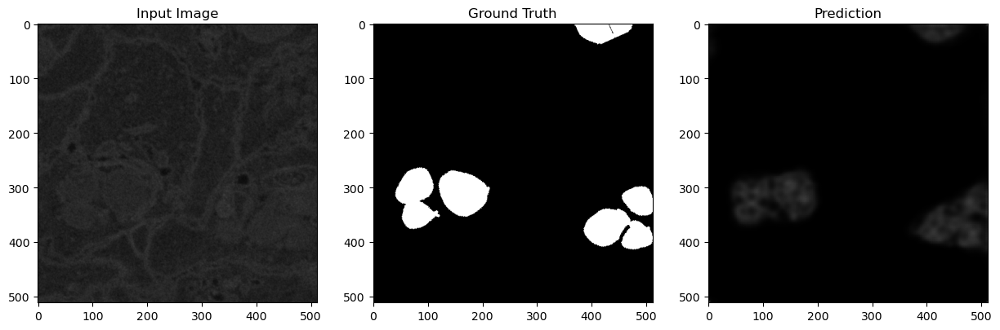

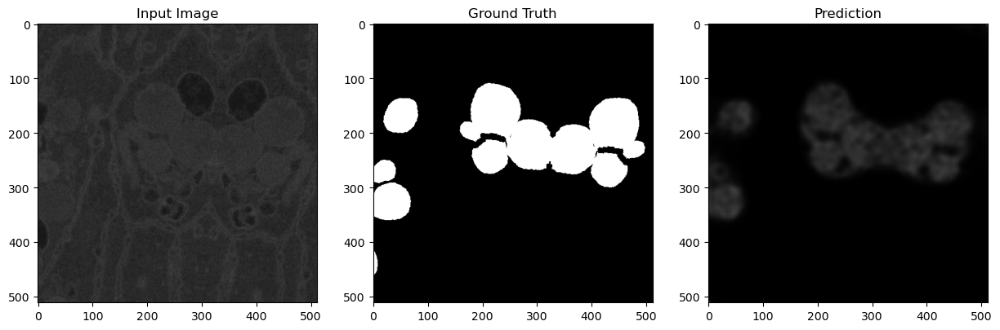

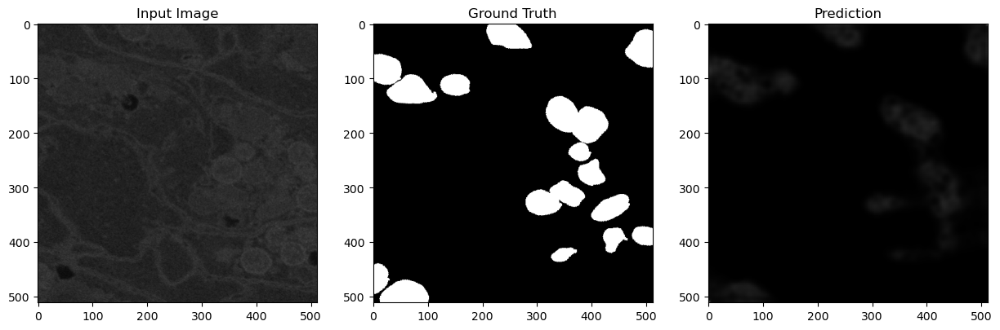

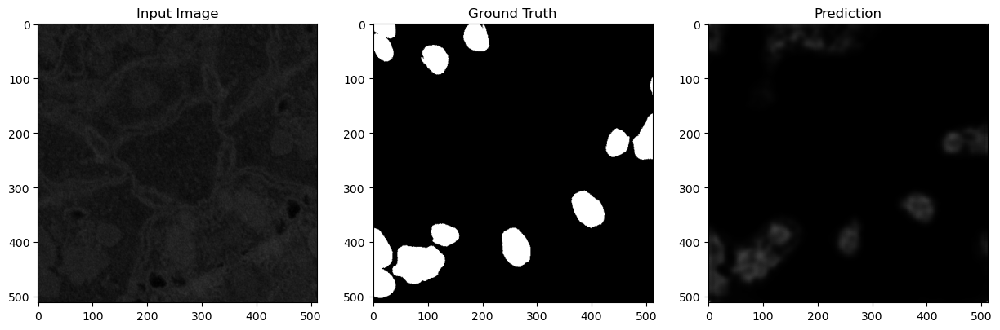

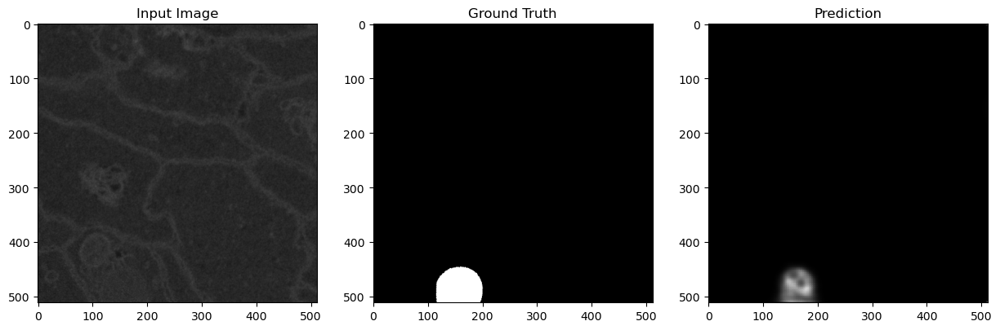

...

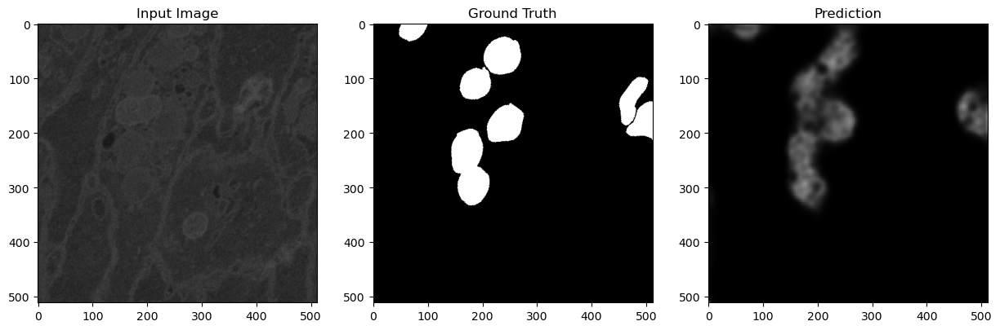

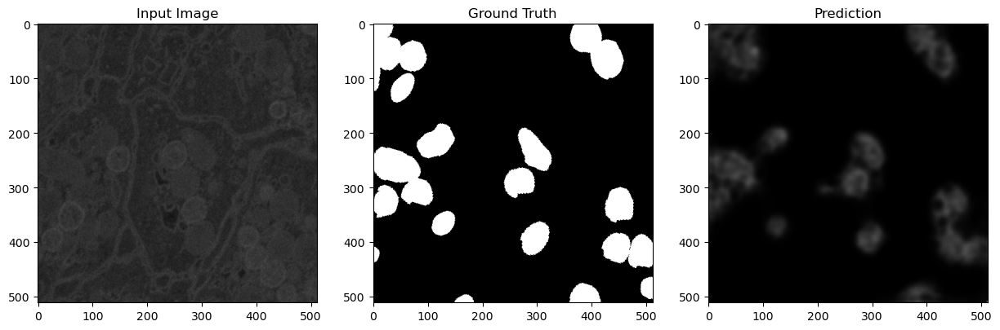

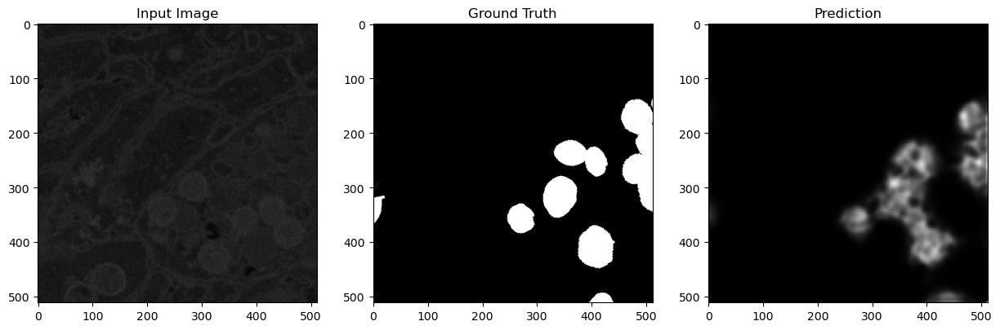

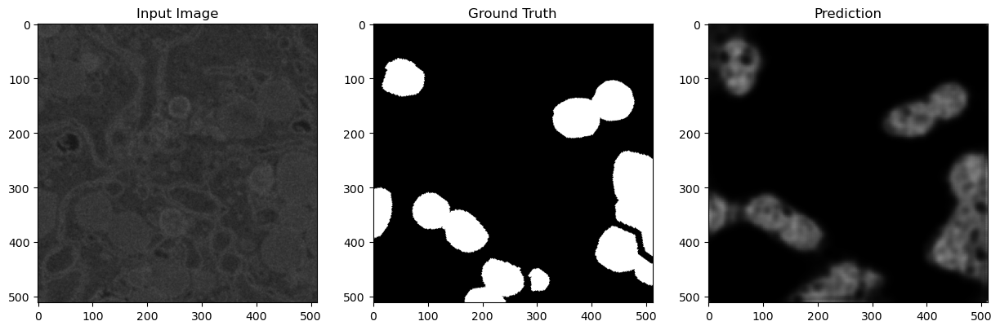

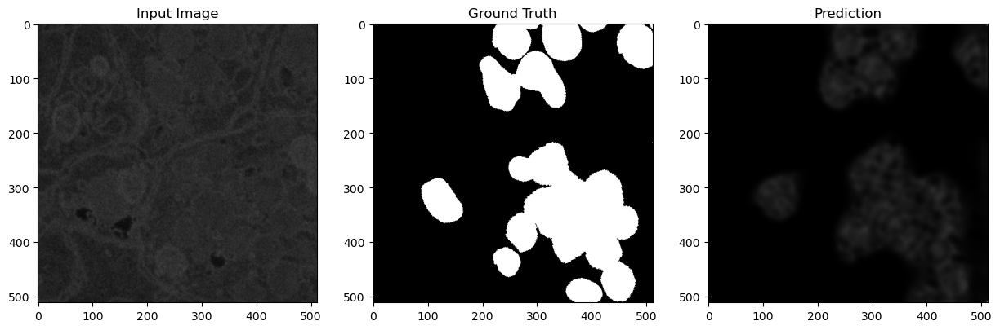

In [23]:
model.eval()
with torch.no_grad():
    for i in range(30):
        image, mask = validation_data[i*10]
        image = image.unsqueeze(0).to(device)  # Move data to GPU if available
        output = model(image)
        output = torch.sigmoid(output).cpu().squeeze().numpy()

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image.cpu().squeeze().permute(1, 2, 0).numpy(), cmap='gray')
        axes[0].set_title('Input Image')
        axes[1].imshow(mask.cpu().squeeze().numpy(), cmap='gray')
        axes[1].set_title('Ground Truth')
        axes[2].imshow(output*100000, cmap='gray')
        axes[2].set_title('Prediction')
        plt.show()

## **Running the Network on New Data**

### Function to stitch predictions patches together

In [5]:
def segment_image(image, model, device, patch_size=512, stride=244):
    model.eval()
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])
    
    # Ensure image is a NumPy array
    if isinstance(image, torch.Tensor):
        image = image.cpu().numpy()
        
    # Ensure the image has 3 channels by stacking it
    if image.ndim == 2:
        image = np.stack([image] * 3, axis=-1)

    # Initialize an empty array for the final mask
    padding = 250 # adding padding along outside of image
    remove_edge = 12
    
    # Pad the image
    image = np.pad(image, ((padding, padding), (padding, padding), (0, 0)), mode='constant',constant_values=100)
    #plt.imshow(image)

    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    image_tensor = image_tensor.to(device)  # Move the tensor to the same device as the model
    _, _, H, W = image_tensor.shape

    #print(H,W)

    mask = np.zeros((H, W))

    # Divide the image into overlapping patches
    for i in range(0, H - patch_size + 1, stride):
        for j in range(0, W - patch_size + 1, stride):
            patch = image_tensor[:, :, i:i + patch_size, j:j + patch_size]
            with torch.no_grad():
                output = model(patch)
                output_mask = torch.sigmoid(output).cpu().squeeze().numpy()
                mask[i+remove_edge:i + patch_size-remove_edge, j+remove_edge:j + patch_size-remove_edge] += output_mask[remove_edge:-remove_edge,remove_edge:-remove_edge]

    # Normalize the mask
    #mask = (mask > 0.5).astype(np.uint8)

    return mask[padding:H-padding,padding: W-padding] #only the middle part of the mask

### Running the Trained Network

In [6]:
# Load the model
model = UNetResNet18(n_classes=1).to(device)  # Move model to GPU if available
model.load_state_dict(torch.load('/gpfs/gsfs12/users/fultonsaj/organelles/alpha-gran.pth'))
model.eval()

# Read the image stack
stack = imread("/gpfs/gsfs12/users/fultonsaj/organelles/raw/ROI1-yz.tif")
predictions = []

# Process each slice in the stack
for i in tqdm(range(0, len(stack)), desc="Processing Images", unit="image"):
    images = stack[i]
    outputs = segment_image(images, model, device)
    predictions.append(outputs)

def renormalize_to_uint8(predictions):
    renormalized_preds = []
    for p in tqdm(predictions, desc="Renormalizing predictions"):
        p_min, p_max = p.min(), p.max()
        p = (p - p_min) / (p_max - p_min)  # Normalize to 0-1
        p = (p * 255).astype(np.uint8)  # Scale to 0-255 and convert to uint8
        renormalized_preds.append(p)
    return renormalized_preds

def save_predictions_as_tiff(predictions, output_path):
    predictions_stack = np.stack(predictions, axis=0)
    imwrite(output_path, predictions_stack)


Processing Images: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 2388/2388 [15:52<00:00,  2.51image/s]


### Visualizing some predictions

/tmp/ipykernel_3653157/1642811389.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 2, figsize=(15, 5))


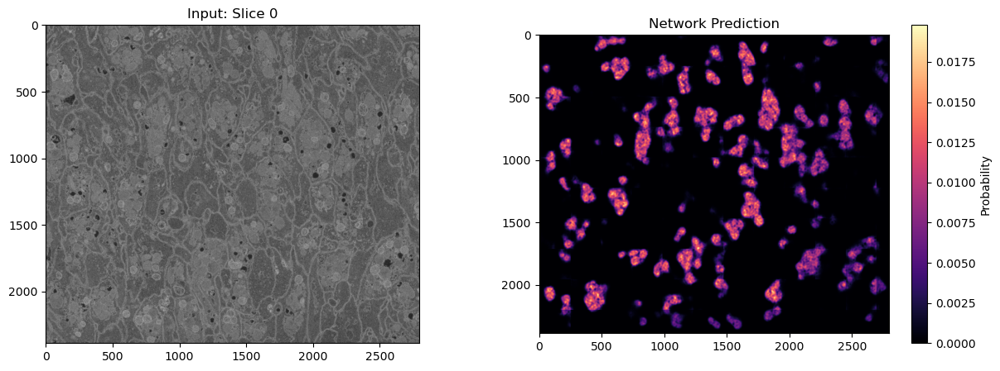

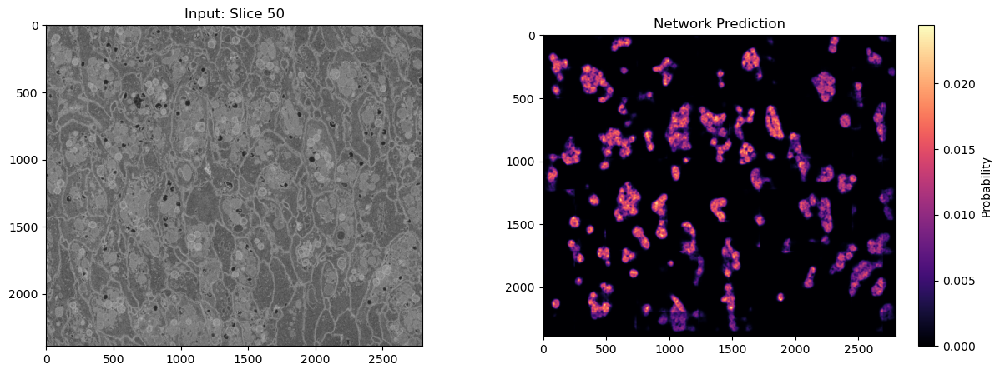

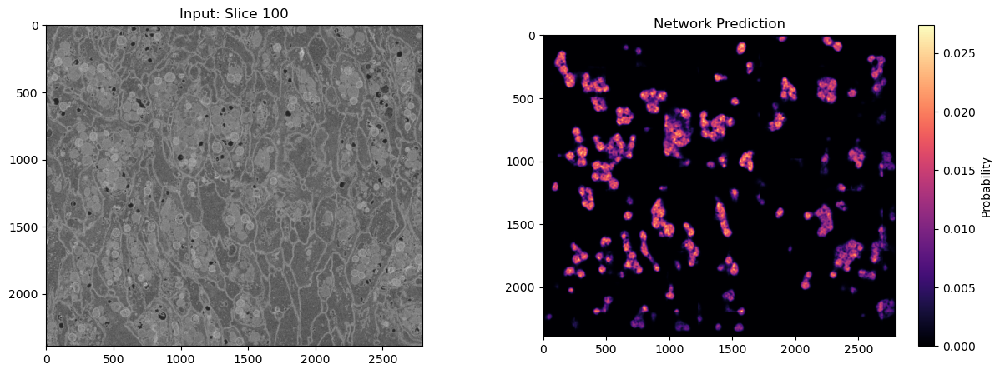

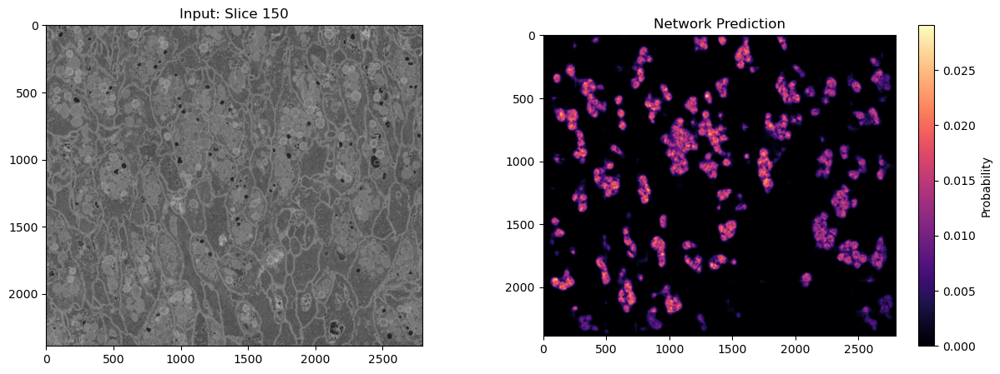

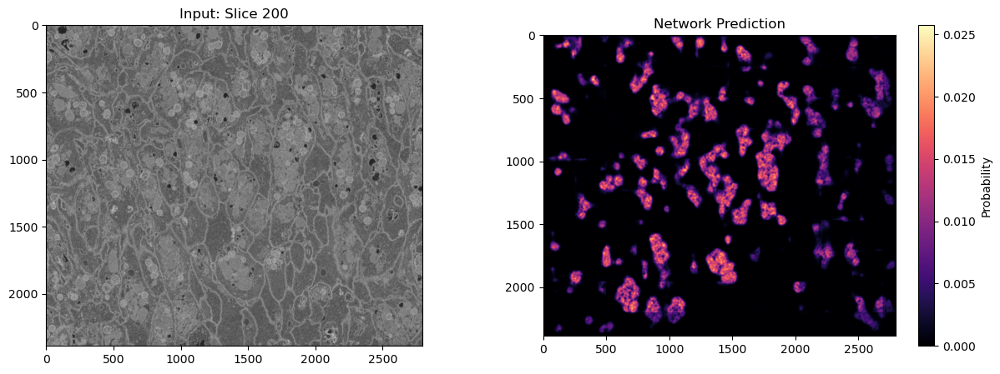

...

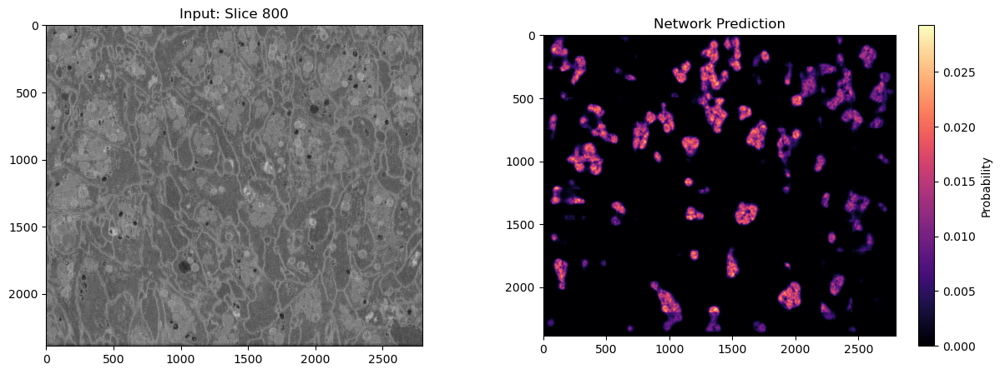

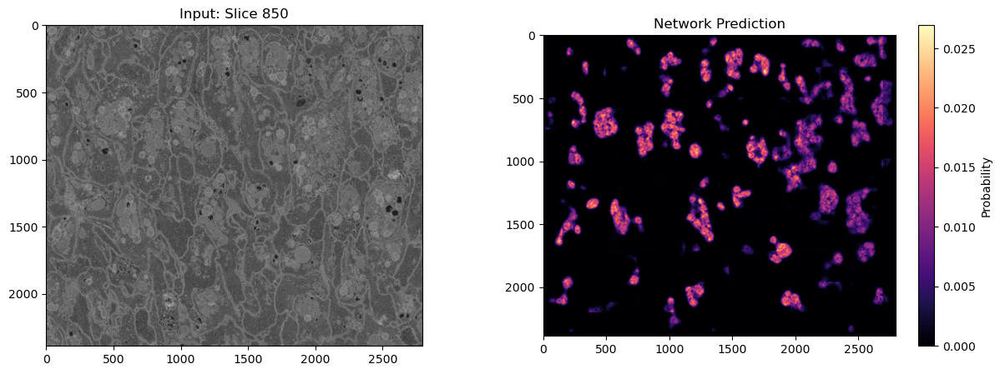

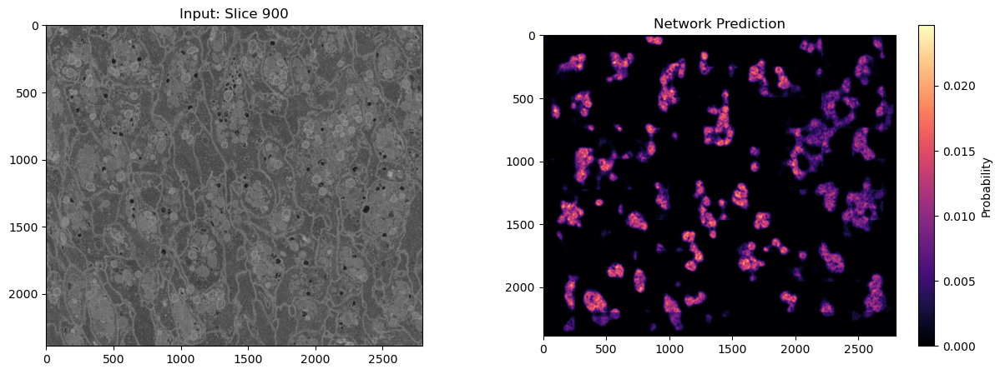

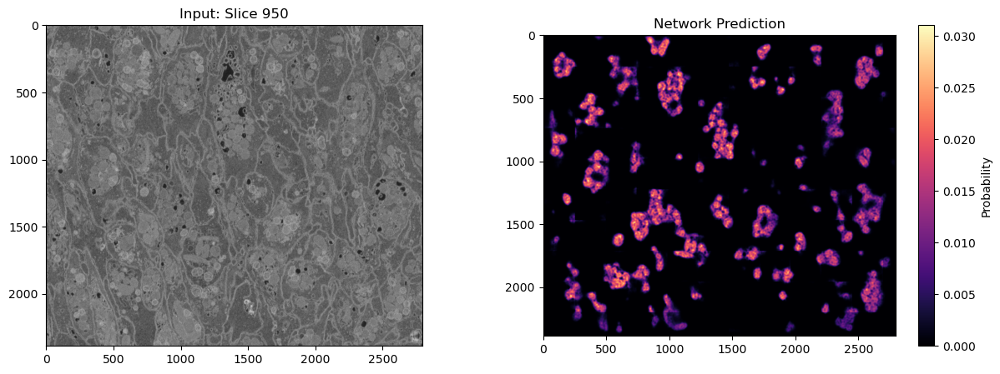

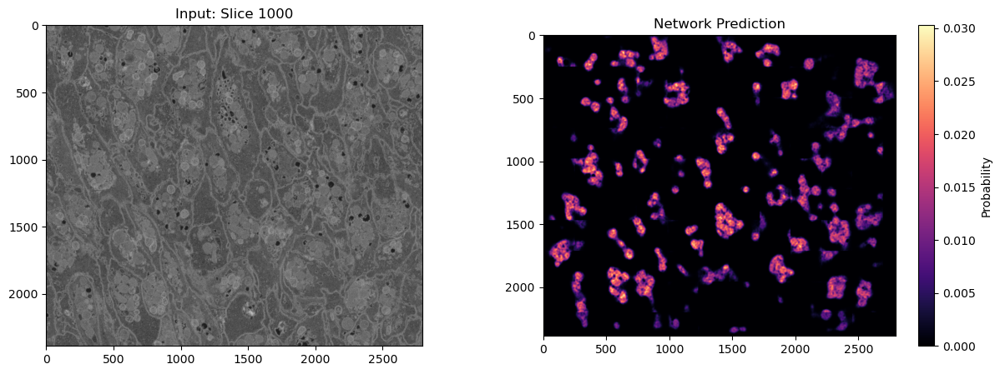

In [6]:
for i in range(0,len(predictions),50): #len(stack),50
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    axes[0].imshow(stack[i], cmap='gray')
    axes[0].set_title(f'Input: Slice {i}')
    cax = axes[1].imshow(predictions[i], cmap='magma')
    axes[1].set_title('Network Prediction')
    cbar = fig.colorbar(cax, ax=axes[1])
    cbar.set_label('Probability')

### Function to save predictions as TIFF file

In [ ]:

# Renormalize and save predictions
renormalized_predictions = renormalize_to_uint8(predictions)
save_predictions_as_tiff(renormalized_predictions, '/gpfs/gsfs12/users/fultonsaj/organelles/predictions/alpha-yz.tif')

Renormalizing predictions:  67%|████████████████████████████████████████████████████████████████▊                                | 1596/2388 [00:24<00:13, 59.12it/s]

## Rotate data to predict on orthogonal axis

In [ ]:
# Load the original TIFF stack
input_tiff = '../../augmentation/organelles/mito/p-maps/mito-yz.tif'
output_tiff = '../../augmentation/organelles/mito/p-maps/mito-yz.tif'

# xy -> yz (1,2,0)
# yx -> xz (2,0,1)
# Read the stack into a 3D numpy array
with tf.TiffFile(input_tiff) as tif:
    volume = tif.asarray()  


rotated_slices = np.transpose(volume, (2,0,1))

# Save the slices to a new TIFF stack
tf.imwrite(output_tiff, rotated_slices)


## Merge tiff predictions back together

In [ ]:
# Load the two TIFF stacks
tiff_stack0 = tiff.imread('../Augmentation/organelles/mito/raw-data/image.tif')
tiff_stack1 = tiff.imread('../Augmentation/organelles/mito/new-data/image.tif')
#tiff_stack2 = tiff.imread('../Augmentation/organelles/mito/new-data/image-combined.tif')

# Append the second stack to the first along the z-axis
combined_stack = np.concatenate((tiff_stack0, tiff_stack1), axis=0)

# Save the combined stack to a new TIFF file
tiff.imwrite('../Augmentation/organelles/mito/new-data/image-combined.tif', combined_stack)

# WaterShed: Instance Segmentation

In [8]:
import numpy as np
import tifffile as tiff
from scipy import ndimage as ndi
from skimage.segmentation import watershed  # Corrected import
from skimage.filters import sobel
from skimage.feature import peak_local_max

# Load the TIFF stack (assuming it's in grayscale format with uint8 values)
tiff_stack = tiff.imread('./chunk.tif')

# Preprocessing: apply Sobel filter for edge detection
edges = sobel(tiff_stack)

# Generate markers for the watershed
# Use a distance transform for the probable cell interiors
distance = ndi.distance_transform_edt(tiff_stack)

# Identify local maxima to serve as markers for watershed
#local_maxi = peak_local_max(distance, footprint=np.ones((3, 3, 3)), labels=tiff_stack)  # Removed 'indices' parameter
#markers = ndi.label(local_maxi)[0]

# Perform watershed segmentation
#labels = watershed(-distance, markers, mask=tiff_stack > 0)

# Save the segmented output as a TIFF stack
tiff.imwrite('segmented_cells.tiff', distance.astype(np.uint16))